### Daily versus hourly ERA5 atmospheric forcing, what does NEMO see?

In [1]:
import xarray as xr
import numpy as np
import cmocean
import matplotlib.pyplot as plt
import glob
import sys
sys.path.append('/home/users/birgal/')
from nemo_python_git.utils import fix_lon_range
from nemo_python_git.constants import cesm2_ensemble_members

In [2]:
base  = '/gws/nopw/j04/anthrofail/birgal/NEMO_AIS/'
dir1h         = f'{base}output/ERA5_1h_tune0_efr005/'
dir1d         = f'{base}output/ERA5_1d_tune0_efr005/'
dir1d_radprec = f'{base}output/ERA5_freq_1h_radprec_1d_else/'
dir1d_wind    = f'{base}output/ERA5_freq_1h_wind_1d_else/'

In [3]:
ds1 = xr.open_dataset(f'{base}climate-forcing/CESM2/LE2/processed/CESM2-LE2_windspeed_y1979_ensemble_mean_monthly.nc')
ds2 = xr.open_dataset(f'{base}ERA5-forcing/hourly/ERA5_1h_windspeed_y1982m04_mean.nc')

In [4]:
year = 1979
ds1hS = xr.open_dataset(f'{dir1h}files0/eANT025.L121_1m_{year}0101_{year}1231_SBC.nc')
ds1hT = xr.open_dataset(f'{dir1h}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_T.nc')
ds1hU = xr.open_dataset(f'{dir1h}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_U.nc').isel(depthu=0).rename({'x':'x_grid_T', 'y':'y_grid_T'})
ds1hV = xr.open_dataset(f'{dir1h}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_V.nc').isel(depthv=0).rename({'x':'x_grid_T', 'y':'y_grid_T'})
ds1dS = xr.open_dataset(f'{dir1d}files0/eANT025.L121_1m_{year}0101_{year}1231_SBC_compressed.nc')
ds1dT = xr.open_dataset(f'{dir1d}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_T_compressed.nc')
ds1dU = xr.open_dataset(f'{dir1d}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_U_compressed.nc').isel(depthu=0).rename({'x':'x_grid_T', 'y':'y_grid_T'})
ds1dV = xr.open_dataset(f'{dir1d}files0/eANT025.L121_1m_{year}0101_{year}1231_grid_V_compressed.nc').isel(depthv=0).rename({'x':'x_grid_T', 'y':'y_grid_T'})

# ds1dradS  = xr.open_dataset(f'{dir1d_radprec}files0/eANT025.L121_1m_{year}0101_{year}1231_SBC.nc')
# ds1dwindS = xr.open_dataset(f'{dir1d_wind}files0/eANT025.L121_1m_{year}0101_{year}1231_SBC.nc')

In [5]:
nemo_mask = xr.open_dataset(f'{base}bathymetry/mesh_mask-20250715.nc').squeeze().rename({'x':'x_grid_T', 'y':'y_grid_T'})

In [6]:
def plot_sbc_vars(ds1h, ds1d, variables, vlim, month):
    
    for v,var in enumerate(variables):
        fig, ax = plt.subplots(1,3, figsize=(20,3.5))
        kwags1 = {'ylim':(150,None), 'vmin':vlim[v][0], 'vmax':vlim[v][1], 'cmap':cmocean.cm.balance}
        kwags2 = {'ylim':(150,None), 'vmin':-0.2*vlim[v][1], 'vmax':0.2*vlim[v][1], 'cmap':cmocean.cm.balance}
        ds1h.isel(time_counter=month)[var].where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax[0], **kwags1)
        ds1d.isel(time_counter=month)[var].where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax[1], **kwags1)
        (ds1h.isel(time_counter=month)[var] - ds1d.isel(time_counter=month)[var]).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax[2], **kwags2)
        ax[0].set_title('Hourly');    ax[1].set_title('Daily');    ax[2].set_title('Hourly - daily');
        
    return

Is there any difference in the monthly averaged atmospheric surface boundary conditions seen between the ERA5 hourly and ERA5 daily experiments?

Variables to look at: sohefldo, soshfldo, qsr_oce, qns, qns_oce, qt_oce, qlw_oce, qsb_oce, qla_oce, taum, windsp, precip, snowpre
- Wind
- Shortwave and longwave radiation 
- Precipitation: snowfall and total
- Humidity
- Surface pressure

Differences:
- Surface wind speeds and stress
- Sensible and latent heat flux over ocean seem quite different
- Non-solar heat flux including evaporation - precipitation seems off, so it could also be a humidity difference
- Sea level pressure (could be a consequence rather than a cause)

--> check ERA5_freq_1h_radprec_1d_else (1h msdwswrf, msdwlwrf, mtpr, msr, everything else at 1d frequency) and ERA5_freq_1h_wind_1d_else (1d u10, v10, everything else at 1h frequency)

Experiment ERA5_freq_1h_wind_1d_else and ERA5_freq_1h_radprec_1d_else have an issue with longitude wrapping, so not informative

In [10]:
month=1

**Wind:** There seems to be a fairly significant decrease in wind stress module in the daily experiment and associated decreases in the wind speeds.

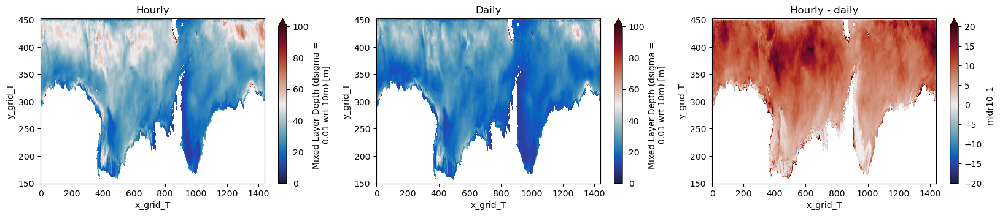

In [15]:
variables = ['mldr10_1']
vlim = [(0,100)]
plot_sbc_vars(ds1hT, ds1dT, variables, vlim, month)

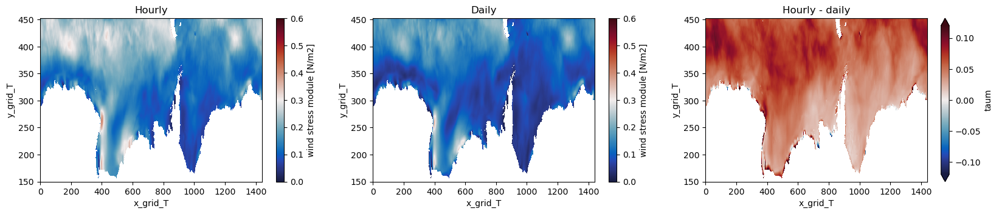

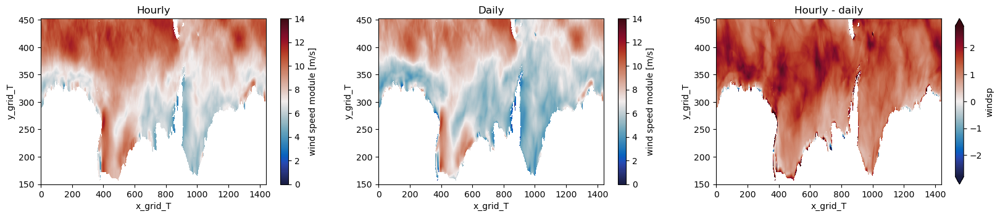

In [18]:
variables = ['taum', 'windsp']
vlim = [(0,0.6), (0,14)]
plot_sbc_vars(ds1hS, ds1dS, variables, vlim, month)

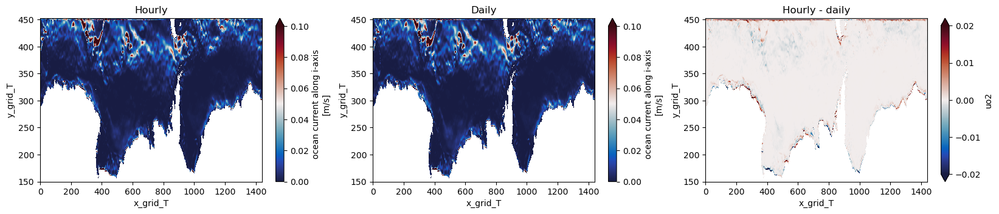

In [37]:
variables = ['uo2']
vlim = [(0,0.1)]
plot_sbc_vars(ds1hU, ds1dU, variables, vlim, month)

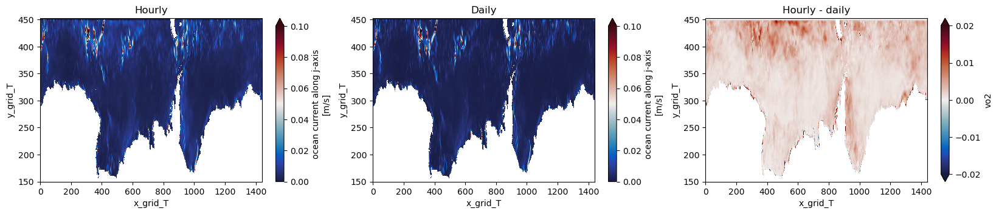

In [38]:
variables = ['vo2']
vlim = [(0,0.1)]
plot_sbc_vars(ds1hV, ds1dV, variables, vlim, month)

**Precipitation:** Doesn't seem likely to be the cause

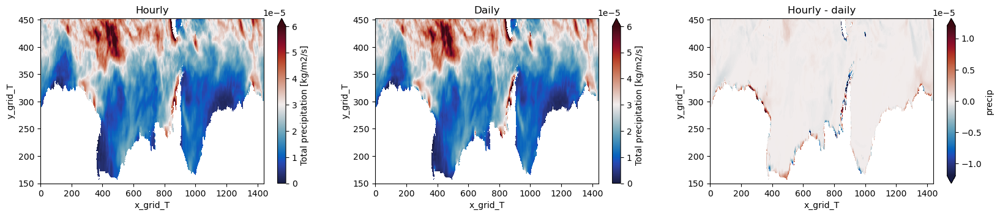

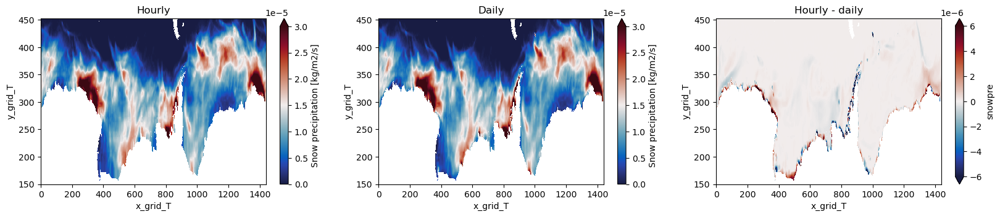

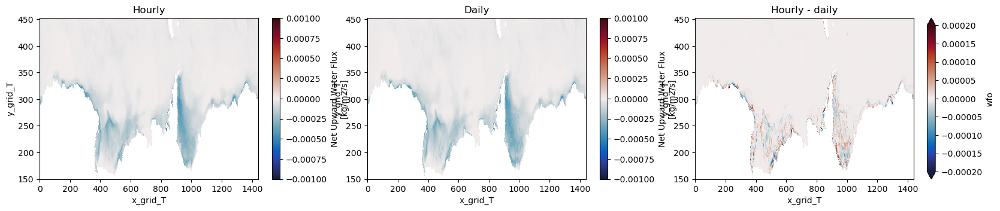

In [13]:
variables = ['precip', 'snowpre', 'wfo']
vlim = [(0,6e-5), (0,3e-5), (-1e-3,1e-3)]
plot_sbc_vars(ds1hS, ds1dS, variables, vlim, month)

**Radiation:** 

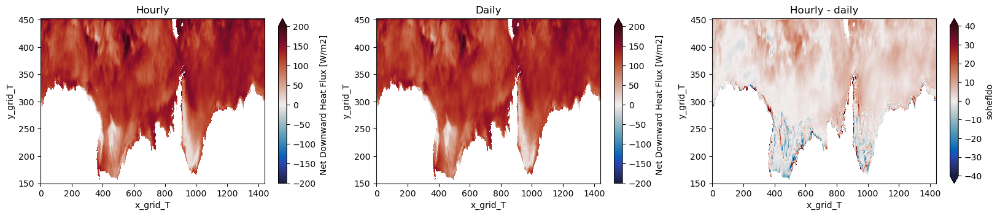

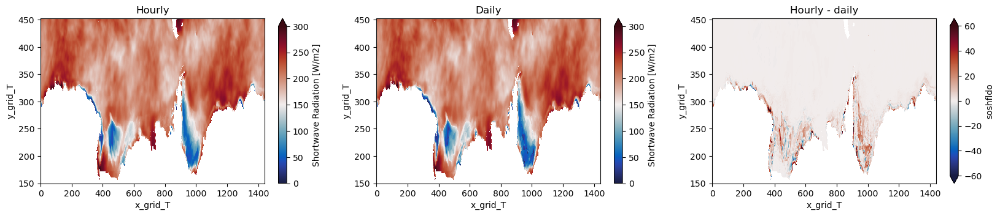

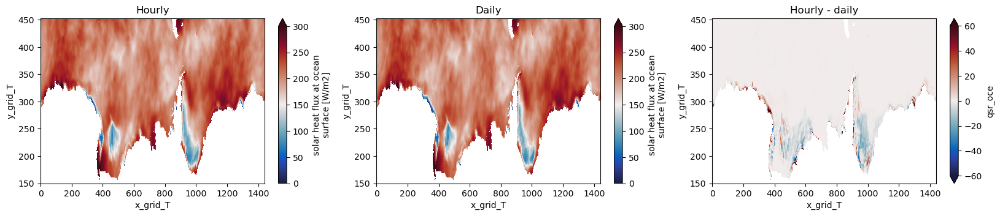

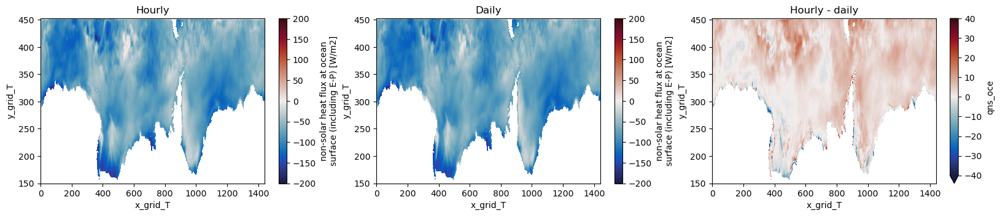

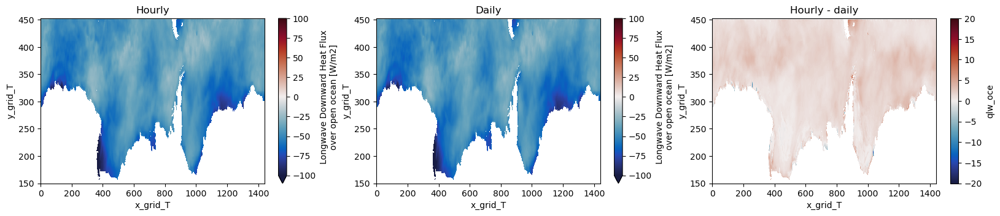

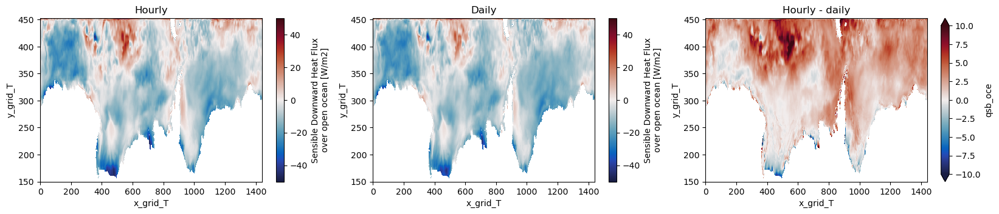

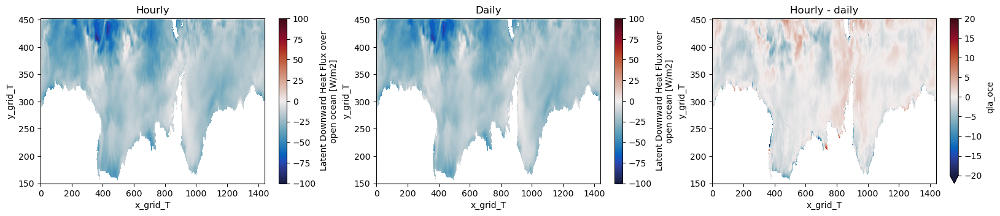

In [14]:
variables = ['sohefldo', 'soshfldo', 'qsr_oce', 'qns_oce', 'qlw_oce', 'qsb_oce', 'qla_oce']
vlim = [(-200,200), (0,300), (0,300), (-200,200), (-100,100), (-50,50), (-100,100)]
plot_sbc_vars(ds1hS, ds1dS, variables, vlim, month)

**Sea level pressure:** 

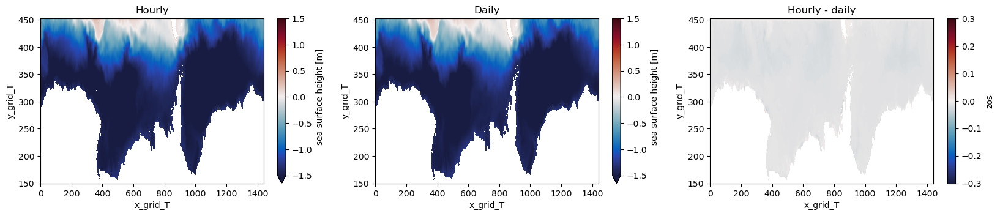

In [15]:
variables = ['zos']
vlim = [(-1.5,1.5)]
plot_sbc_vars(ds1hT, ds1dT, variables, vlim, month)

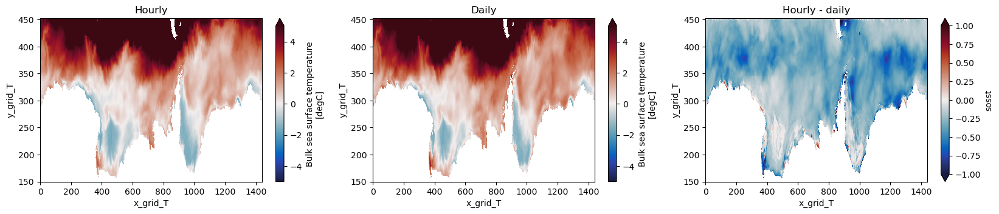

In [16]:
variables = ['sosst']
vlim = [(-5,5)]
plot_sbc_vars(ds1hT, ds1dT, variables, vlim, month)

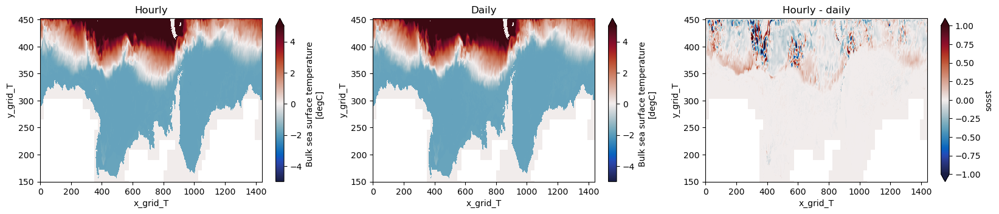

In [105]:
variables = ['sosst']
vlim = [(-5,5)]
plot_sbc_vars(ds1hT, ds1dT, variables, vlim, month)

### Look at daily cycle of wind speeds in forcing:

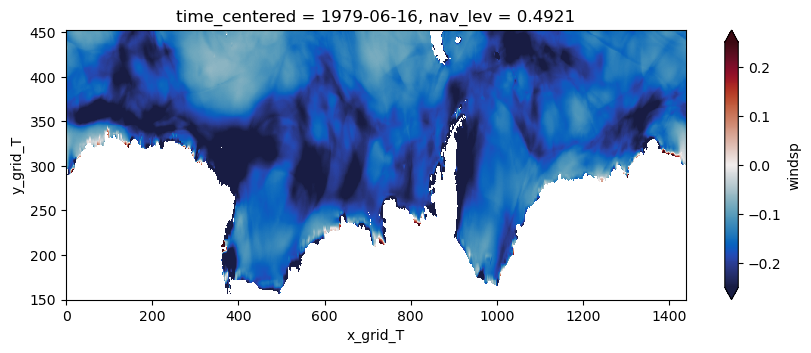

In [36]:
month=5
fig, ax = plt.subplots(1,1, figsize=(10,3.5))
kwags1 = {'ylim':(150,None), 'vmin':-0.25, 'vmax':0.25, 'cmap':cmocean.cm.balance}
((ds1dS.isel(time_counter=month)['windsp']/ds1hS.isel(time_counter=month)['windsp'])-1).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax, **kwags1)

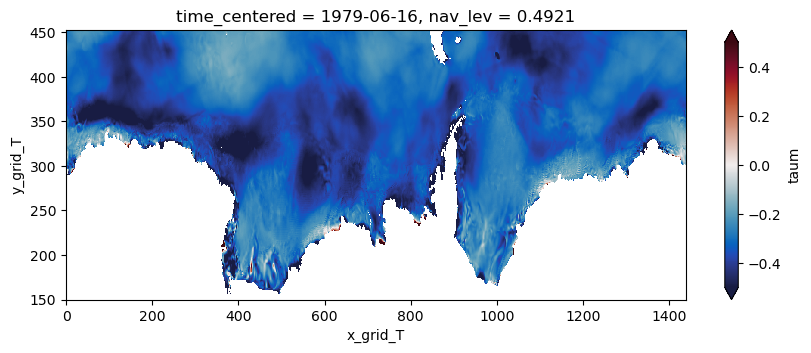

In [35]:
month=5
fig, ax = plt.subplots(1,1, figsize=(10,3.5))
kwags1 = {'ylim':(150,None), 'vmin':-0.5, 'vmax':0.5, 'cmap':cmocean.cm.balance}
((ds1dS.isel(time_counter=month)['taum']/ds1hS.isel(time_counter=month)['taum'])-1).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax, **kwags1)

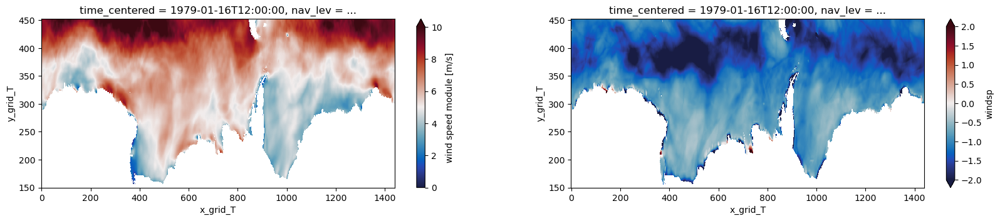

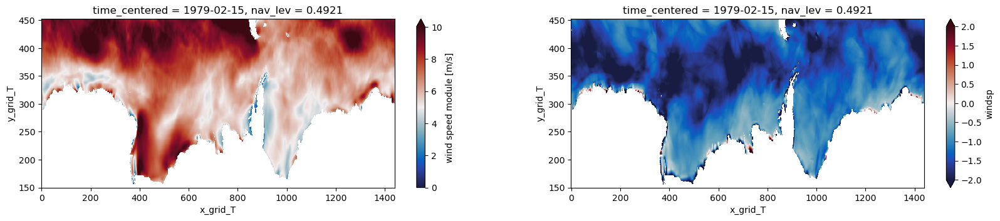

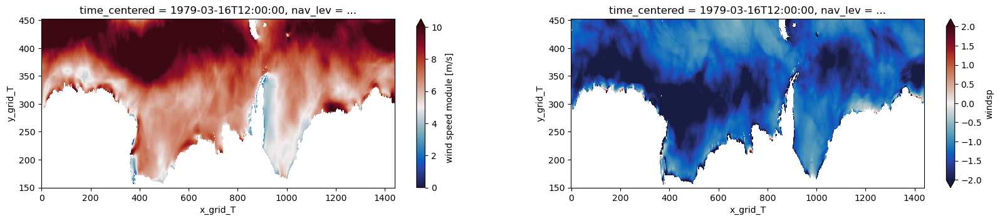

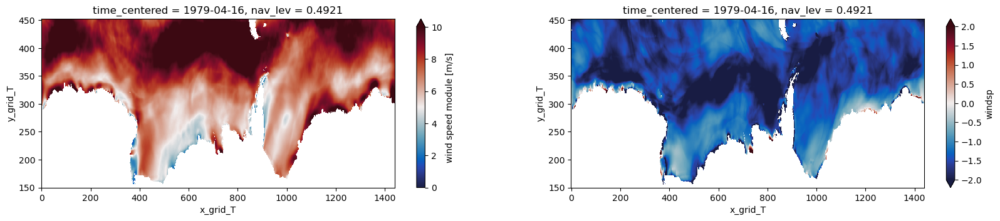

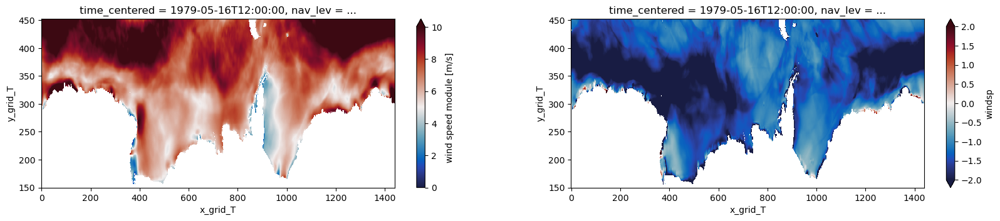

...

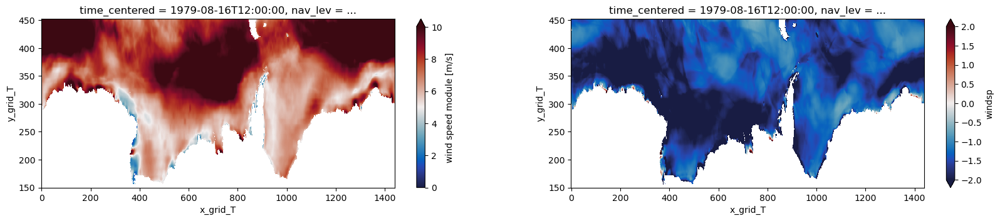

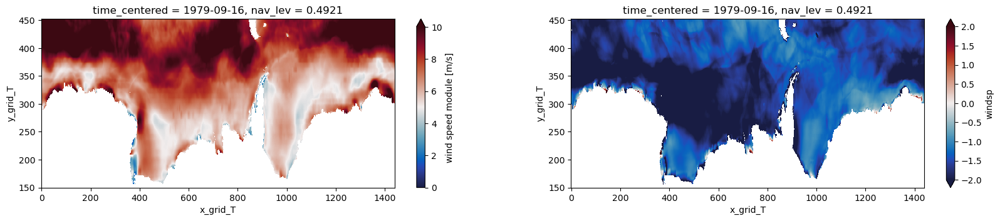

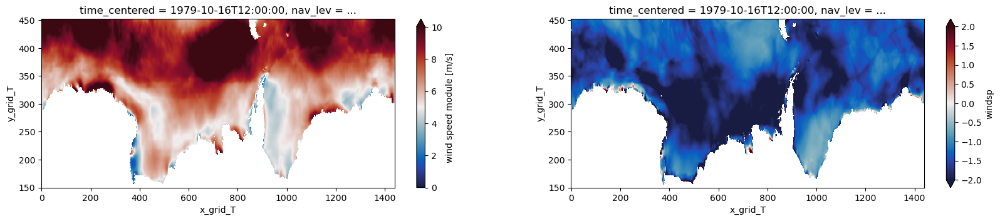

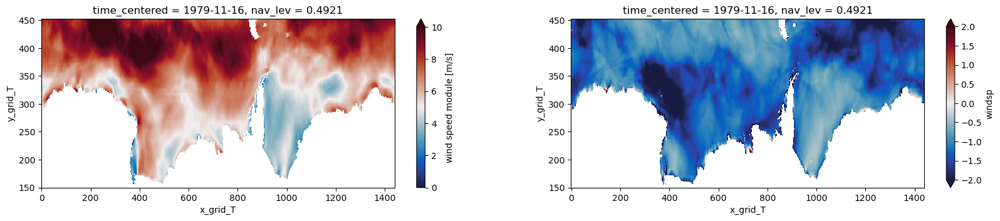

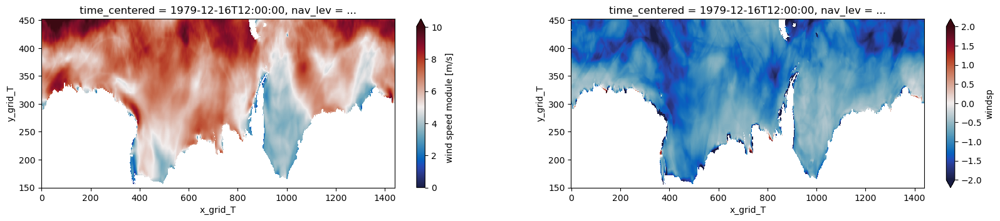

In [40]:
for month in range(0,12):
    fig, ax = plt.subplots(1,2, figsize=(20,3.5))
    # kwags1 = {'ylim':(150,None), 'vmin':0.5, 'vmax':1.5, 'cmap':cmocean.cm.balance}
    # (ds1dS.isel(time_counter=month)['windsp']/ds1hS.isel(time_counter=month)['windsp']).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax, **kwags1)
    kwags1 = {'ylim':(150,None), 'vmin':-2, 'vmax':2, 'cmap':cmocean.cm.balance}
    (ds1dS.isel(time_counter=month)['windsp']).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax[0], ylim=(150,None), vmin=0, vmax=10, cmap=cmocean.cm.balance)
    (ds1dS.isel(time_counter=month)['windsp'] - ds1hS.isel(time_counter=month)['windsp']).where(nemo_mask.tmask.isel(nav_lev=0)==1).plot(ax=ax[1], **kwags1)

In [15]:
dirf1h = '/gws/nopw/j04/anthrofail/birgal/NEMO_AIS/ERA5-forcing/hourly_me/files/'
dirf1d = '/gws/nopw/j04/anthrofail/birgal/NEMO_AIS/ERA5-forcing/daily/files/'

In [8]:
def load_ERA5_var(var):

    f1h = xr.open_dataset(f'{dirf1h}{var}_y1979m01.nc').sel(latitude=slice(-50,-80))
    f1h['longitude'] = fix_lon_range(f1h['longitude'])
    f1h = f1h.sortby('longitude')

    # f1d = xr.open_dataset(f'{dirf1d}{var}_time_y1979.nc').sel(latitude=slice(-50,-80)).isel(time=slice(0,31))
    f1d = xr.open_dataset(f'{dirf1d}{var}_time_y1979.nc').sel(latitude=slice(-50,-80)).isel(time=slice(0,31))
    f1d['longitude'] = fix_lon_range(f1d['longitude'])
    f1d = f1d.sortby('longitude')
    
    return f1h, f1d

In [9]:
def plot_ERA5_freqs(f1h, f1d, var):
    
    fig, ax = plt.subplots(1,1, figsize=(8,3))
    f1h[var].where(mask==0).mean(dim=['longitude','latitude']).plot(ax=ax, label=f'hourly {var}')
    f1d[var].where(mask==0).mean(dim=['longitude','latitude']).plot(ax=ax, label=f'daily {var}')
    ax.set_xlabel('Time')
    ax.set_ylabel(var)
    ax.set_title('')
    ax.legend()

    return

In [10]:
f1h_u10, f1d_u10 = load_ERA5_var('u10')
f1h_v10, f1d_v10 = load_ERA5_var('v10')
f1h_t2m, f1d_t2m = load_ERA5_var('t2m')
f1h_d2m, f1d_d2m = load_ERA5_var('d2m')
f1h_msl, f1d_msl = load_ERA5_var('msl')
f1h_mtpr, f1d_mtpr = load_ERA5_var('mtpr')
f1h_msr, f1d_msr   = load_ERA5_var('msr')
f1h_msdwswrf, f1d_msdwswrf = load_ERA5_var('msdwswrf')
f1h_msdwlwrf, f1d_msdwlwrf = load_ERA5_var('msdwlwrf')

In [11]:
mask = xr.open_dataset(f'{dirf1h}../ERA5-landmask.nc').isel(time=0).sel(latitude=slice(-50,-80)).lsm
mask['longitude'] = fix_lon_range(mask['longitude'])

In [12]:
f1h_u10['speed'] = np.sqrt(f1h_u10.u10**2 + f1h_v10.v10**2)
f1d_u10['speed'] = np.sqrt(f1d_u10.u10**2 + f1d_v10.v10**2)

f1h_u10['u10_speed'] = np.sqrt(f1h_u10.u10**2)
f1d_u10['u10_speed'] = np.sqrt(f1d_u10.u10**2)
f1h_v10['v10_speed'] = np.sqrt(f1h_v10.v10**2)
f1d_v10['v10_speed'] = np.sqrt(f1d_v10.v10**2)

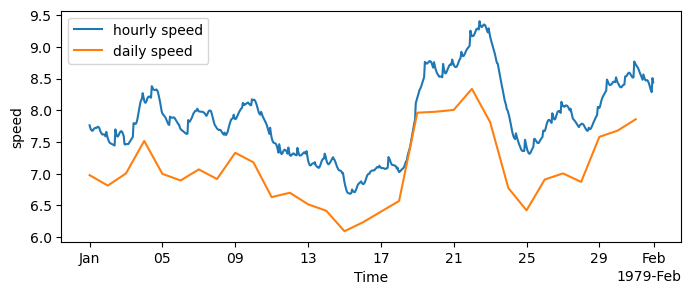

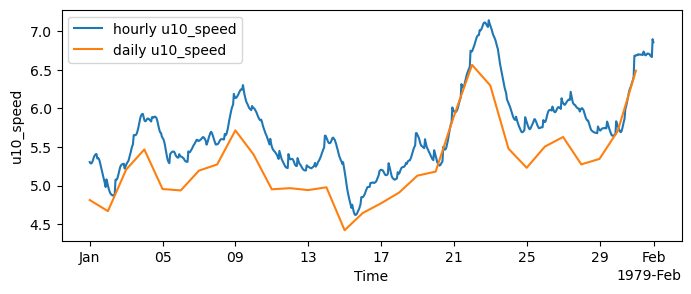

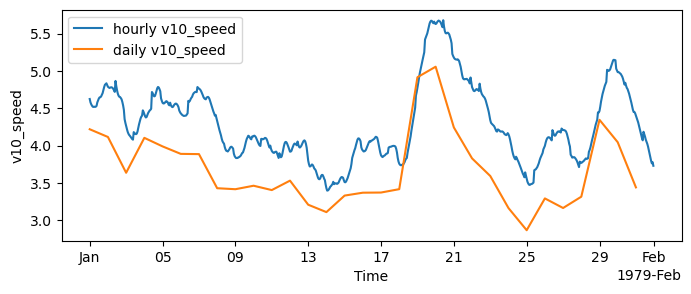

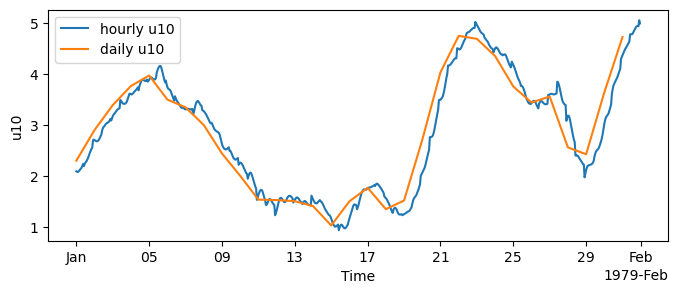

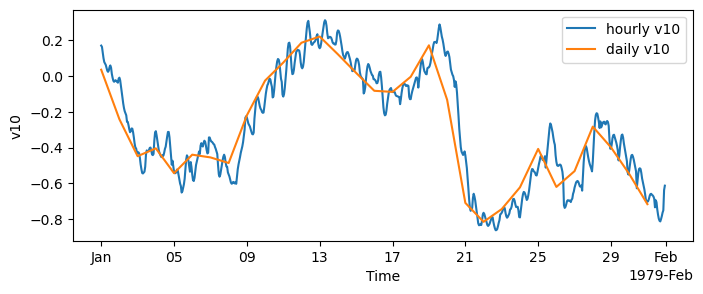

In [13]:
plot_ERA5_freqs(f1h_u10, f1d_u10, 'speed')
plot_ERA5_freqs(f1h_u10, f1d_u10, 'u10_speed')
plot_ERA5_freqs(f1h_v10, f1d_v10, 'v10_speed')
plot_ERA5_freqs(f1h_u10, f1d_u10, 'u10')
plot_ERA5_freqs(f1h_v10, f1d_v10, 'v10')

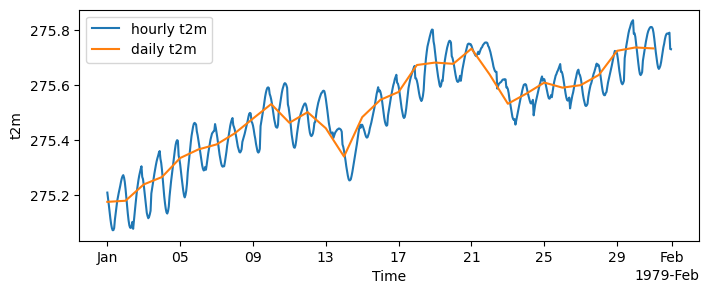

In [144]:
plot_ERA5_freqs(f1h_t2m, f1d_t2m, 't2m')

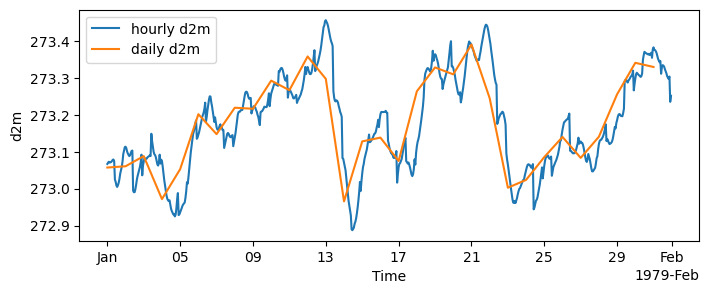

In [145]:
plot_ERA5_freqs(f1h_d2m, f1d_d2m, 'd2m')

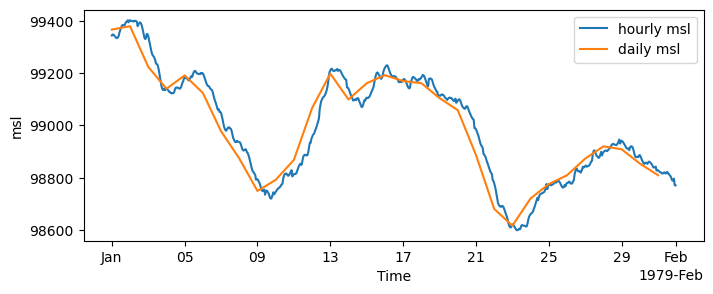

In [147]:
plot_ERA5_freqs(f1h_msl, f1d_msl, 'msl')

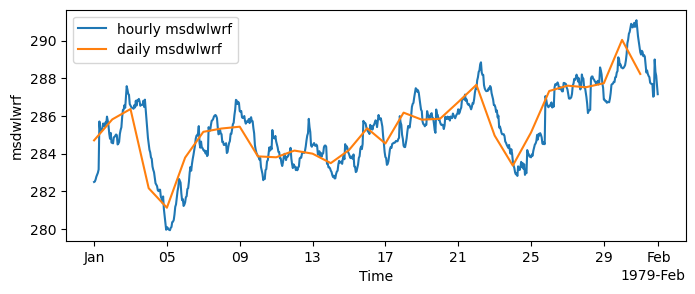

In [150]:
plot_ERA5_freqs(f1h_msdwlwrf, f1d_msdwlwrf, 'msdwlwrf')

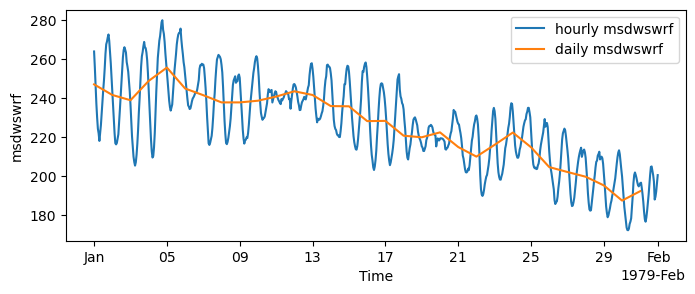

In [151]:
plot_ERA5_freqs(f1h_msdwswrf, f1d_msdwswrf, 'msdwswrf')

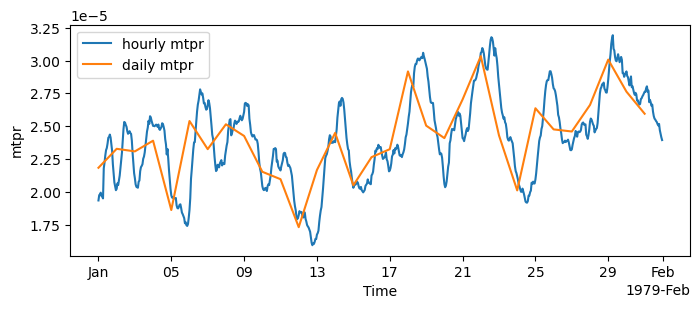

In [152]:
plot_ERA5_freqs(f1h_mtpr, f1d_mtpr, 'mtpr')

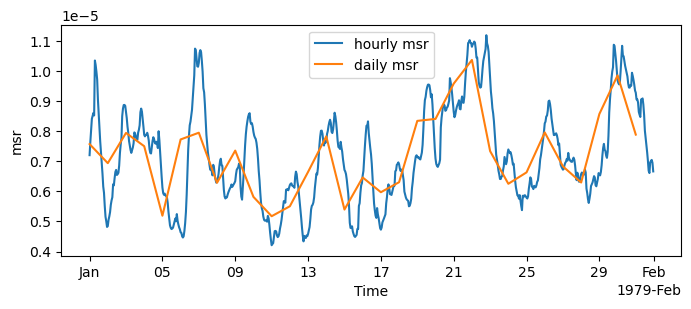

In [153]:
plot_ERA5_freqs(f1h_msr, f1d_msr, 'msr')

## Based on the wind bias correction information, how different would the CESM2 bias correction be if bias-corrected to the mean of the hourly files rather than the mean of the daily files?

In [38]:
era5_dir = '/gws/nopw/j04/anthrofail/birgal/NEMO_AIS/ERA5-forcing/daily/files/'        
era5_u10 = xr.open_dataset(f'{era5_dir}u10_y1979.nc').rename({'longitude':'lon','latitude':'lat'}).sortby('lat').sel(lat=slice(-90,-50)).isel(valid_time=slice(0,31))
era5_v10 = xr.open_dataset(f'{era5_dir}v10_y1979.nc').rename({'longitude':'lon','latitude':'lat'}).sortby('lat').sel(lat=slice(-90,-50)).isel(valid_time=slice(0,31))
theta    = np.arctan2(era5_u10.u10, era5_v10.v10)
theta['lon'] = fix_lon_range(theta['lon'])
theta_1d     = np.rad2deg(theta).rename('wind_angle').mean(dim='valid_time').to_dataset() #.to_netcdf(f'{era5_dir}ERA5_1d_windangle_y1979m01_mean.nc')

In [39]:
era5_speed_monthly = xr.open_dataset(f'{base}ERA5-forcing/hourly/ERA5_1h_windspeed_y1979m01_mean.nc')
era5_speed_monthly = era5_speed_monthly.rename({'longitude':'lon','latitude':'lat'})
era5_speed_monthly['lon'] = fix_lon_range(era5_speed_monthly['lon'])
theta_1h = xr.open_dataset(f'{base}ERA5-forcing/hourly/ERA5_1h_windangle_y1979m01_mean.nc')
theta_1h = theta_1h.rename({'longitude':'lon','latitude':'lat'})
theta_1h['wind_angle'] = np.rad2deg(theta_1h['wind_angle'])
theta_1h['lon'] = fix_lon_range(theta_1h['lon'])

In [43]:
dirf1h = '/gws/nopw/j04/anthrofail/birgal/NEMO_AIS/ERA5-forcing/hourly/'
mask = xr.open_dataset(f'{dirf1h}../ERA5-landmask.nc').rename({'latitude':'lat', 'longitude':'lon'}).isel(time=0).sel(lat=slice(-50,-80)).lsm
mask['lon'] = fix_lon_range(mask['lon'])

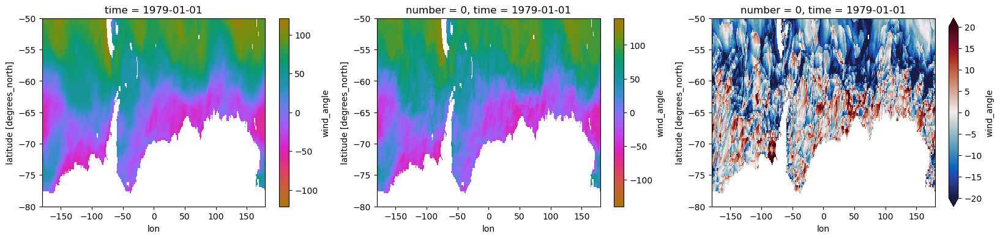

In [46]:
fig, ax = plt.subplots(1,3, figsize=(20,4))
kwags={'ylim':(-80,-50), 'cmap':cmocean.cm.phase}
kwagsa={'ylim':(-80,-50), 'cmap':cmocean.cm.balance, 'vmin':-20, 'vmax':20}
theta_1h.wind_angle.sortby('lon').where(mask==0).plot(ax=ax[0], **kwags)
theta_1d.wind_angle.sortby('lon').where(mask==0).plot(ax=ax[1], **kwags)
(theta_1h.wind_angle - theta_1d.wind_angle).sortby('lon').where(mask==0).plot(ax=ax[2], **kwagsa)

In [44]:
era5_dir  = f'{base}ERA5-forcing/hourly/'
# era5_speed_monthly = xr.open_mfdataset(f'{era5_dir}ERA5_1h_windspeed_1979-1980_mean_m*')
era5_speed_monthly = xr.open_dataset(f'{era5_dir}ERA5_1h_windspeed_y1979m01_mean.nc')
era5_speed_monthly = era5_speed_monthly.rename({'longitude':'lon','latitude':'lat'})
era5_speed_monthly['lon'] = fix_lon_range(era5_speed_monthly['lon'])

era5_dir2  = f'{base}ERA5-forcing/daily/files/processed/'
era5_u_monthly = xr.open_dataset(f'{era5_dir2}ERA5_u10_mean_monthly.nc')
era5_v_monthly = xr.open_dataset(f'{era5_dir2}ERA5_v10_mean_monthly.nc')
era5_speed_monthly2 = np.sqrt(era5_u_monthly.u10**2 + era5_v_monthly.v10**2).rename('windspeed').to_dataset()

cesm2_dir = f'{base}climate-forcing/CESM2/LE2/processed/'
cesm2_speed_monthly = xr.open_dataset(f'{cesm2_dir}CESM2-LE2_windspeed_ensemble_mean_monthly.nc')
cesm2_speed_monthly = cesm2_speed_monthly.__xarray_dataarray_variable__.to_dataset(name='windspeed')

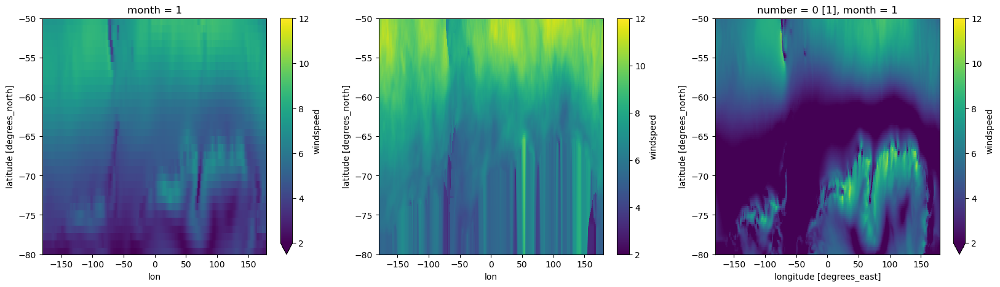

In [48]:
fig, ax = plt.subplots(1,3, figsize=(20,5))

kwags={'vmin':2,'vmax':12,'ylim':(-80,-50)}

cesm2_speed_monthly.isel(month=0).windspeed.sortby('lon').plot(ax=ax[0], **kwags)
era5_speed_monthly.windspeed.sortby('lon').plot(ax=ax[1], **kwags)
era5_speed_monthly2.windspeed.isel(month=0).sortby('lon').plot(ax=ax[2], **kwags)

In [34]:
era5_speed_monthly

<xarray.Dataset> Size: 2MB
Dimensions:    (latitude: 161, longitude: 1440)
Coordinates:
  * latitude   (latitude) float32 644B -90.0 -89.75 -89.5 ... -50.5 -50.25 -50.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Data variables:
    windspeed  (latitude, longitude) float64 2MB ...